In [4]:
# https://aihalapathirana.medium.com/generative-adversarial-networks-for-anime-face-generation-pytorch-1b4037930e21

In [3]:
# api_token = {"username":"nikitakakurnikov", "key":"fe2d0cbbd1d8ee38b5e181a121a93603"}

# import json

# with open('/home/klapeyron/.kaggle/kaggle.json', 'w') as file:
#     json.dump(api_token, file)

In [1]:
# import kaggle
# def download_data():
#     kaggle.api.authenticate()
#     kaggle.api.dataset_download_files('lunarwhite/anime-face-dataset-ntumlds', path='./', unzip=True)
# download_data()

In [1]:
import torch
from torch import nn
from torchvision import transforms
from torchvision.utils import save_image, make_grid
from torch.utils.data import Dataset, DataLoader
from torch import optim
import os
from tqdm import tqdm
from PIL import Image
import random
import glob
import numpy as np, pandas as pd
import matplotlib.pyplot as plt

if torch.cuda.is_available():
    device=torch.device('cuda')
else:
    device=torch.device('cpu')
print(device)

cuda


36740


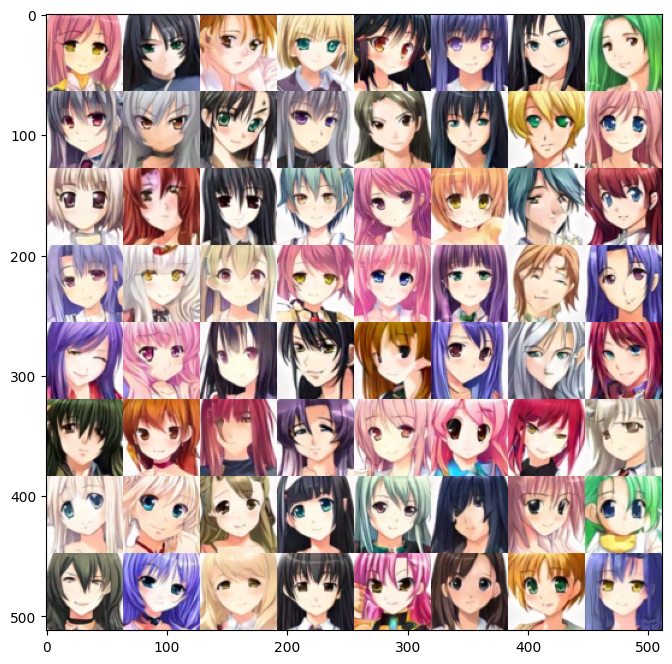

In [2]:
image_list = []
rows = []
for filename in glob.glob('./images/*.jpg'):
    im=Image.open(filename)
    rows.append([filename])
    image_list.append(filename)
print(len(image_list))
def gallery(array, ncols=8):
    nindex, height, width, intensity = array.shape
    nrows = nindex//ncols
    assert nindex == nrows*ncols
    result = (array.reshape(nrows, ncols, height, width, intensity)
              .swapaxes(1,2)
              .reshape(height*nrows, width*ncols, intensity))
    return result
def make_array():
    arr = []
    # Randomly select 64 images to visualize
    for i in range(64):
        random_image = random.choice(image_list)
        arr.append(np.asarray(
                    Image.open(random_image).convert('RGB')
                    ))
    return np.array(arr)

array = make_array()
result = gallery(array)
plt.figure(figsize=(8,8))
plt.imshow(result)
plt.show()

In [4]:
df = pd.DataFrame(rows)
df.to_csv('data.csv', index=False, header = None)

# Preprocessing
#The batch_size is defined based on the memory of GPU or CPU.
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
transform = transforms.Compose([transforms.CenterCrop(64),
                                transforms.Resize(64, interpolation=2),
                                transforms.ToTensor(),
                                transforms.Normalize(*stats)])
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]
  
# loading data .
class AnimeData(Dataset):
    """
    Wrap the data into a Dataset class, and then pass it to the DataLoader
    :__init__: Initialization data
    :__getitem__: support the indexing such that dataset[i] can be used to get ith sample
    :__len__: return the size of the dataset.
    """
    def __init__(self, root, transform=None):
        self.frame = pd.read_csv(root, header=None)
        self.transform = transform
        
    def __len__(self):
        return len(self.frame)
    
    def __getitem__(self, index):
        image_name = self.frame.iloc[index, 0]
        image = Image.open(image_name)
        image = self.transform(image)
        return image

trainset = AnimeData(root='./data.csv', transform=transform)
trainloader = DataLoader(trainset, batch_size, shuffle=True, num_workers=0)

100%|██████████| 288/288 [00:11<00:00, 25.04it/s]


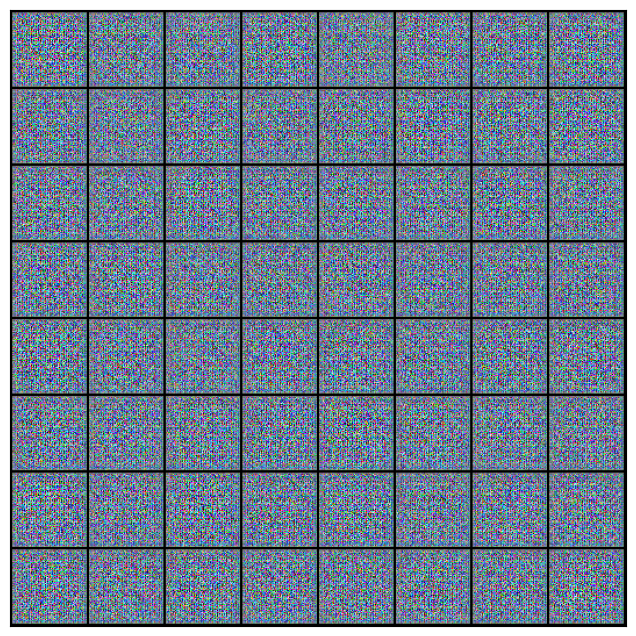

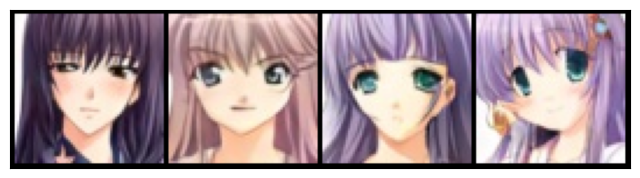

In [9]:
latent_size = 128
class Generator(nn.Module):
    def __init__(self, latent_size):
        super(Generator,self).__init__()
        """
        Initialize the Generator Module
        :param latent_size: The length of the input latent vector
        """
        self.conv_block1 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=latent_size, out_channels=512, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=64, out_channels=3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
            
    def forward(self,x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: A 3x64x64 Tensor image as output
        """
        x = self.conv_block1(x)
        return x
        
        
G=Generator(latent_size).to(device)
# random latent tensors
noise = torch.randn(batch_size, latent_size, 1, 1).to(device)
# use generator model to generate fake image 
fake_images = G(noise)

#visualize the fake images by function show_images

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach().cpu()[:nmax]), nrow=8).permute(1, 2, 0))
    
show_images(fake_images)

for real_images in tqdm(trainloader):
    real_images=(real_images).to(device)
    
show_images(real_images)

In [12]:
# Create your Discriminator model
class Discriminator(nn.Module):
    def __init__(self,inchannels):
        super(Discriminator,self).__init__()
        """
        Initialize the Discriminator Module
        :param inchannels: The depth of the first convolutional layer
        """
        self.conv_block1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=2, padding=0),
            nn.Flatten(),
            nn.Sigmoid()
        )
        
    def forward(self,x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: Discriminator logits; the output of the neural network
        """
        x = self.conv_block1(x)
        return x
        
D=Discriminator(3).to(device)

In [14]:
# Create optimizers for the discriminator D and generator G
# Define your learning rate
lr=0.0002
opt_d = optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
opt_g = optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))

In [15]:
loss_fn = torch.nn.MSELoss()
def Real_loss(preds,targets):
    '''
       Calculates how close discriminator outputs are to being real.
       param, D_out: discriminator logits
       return: real loss
    '''
    beta_distr = torch.distributions.beta.Beta(1,5,validate_args=None)
    label_noise = beta_distr.sample(sample_shape=targets.shape).to(torch.device(device))
    loss= loss_fn(targets,preds-label_noise)
    return loss
  
def Fake_loss(preds,targets):
    '''
       Calculates how close discriminator outputs are to being fake.
       param, D_out: discriminator logits
       return: fake loss
    '''
    beta_distr = torch.distributions.beta.Beta(1,5,validate_args=None)
    label_noise = beta_distr.sample(sample_shape=targets.shape).to(torch.device(device))
    loss= loss_fn(targets,preds+label_noise)
    return loss

100%|██████████| 288/288 [00:32<00:00,  8.75it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [1/15], loss_g: 0.6893, loss_d: 0.0683, real_score: 0.7511, fake_score: 0.0001
Saving generated-images-0001.png


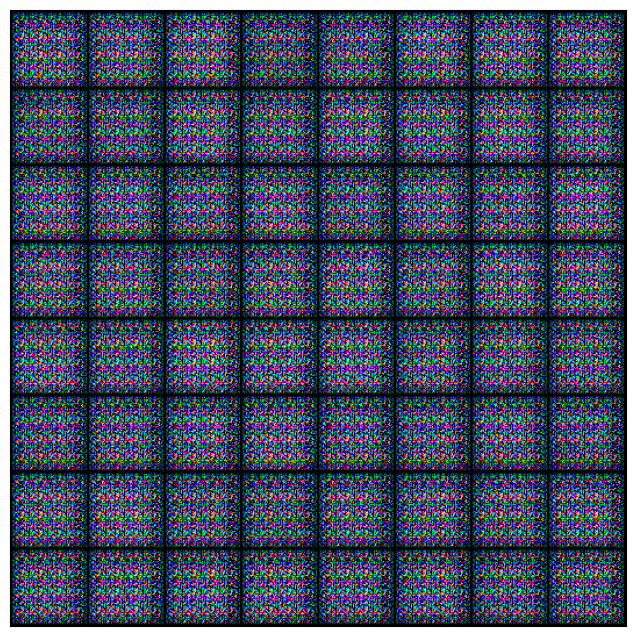

100%|██████████| 288/288 [00:32<00:00,  8.81it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [2/15], loss_g: 0.5761, loss_d: 0.3560, real_score: 0.6759, fake_score: 0.6773
Saving generated-images-0002.png


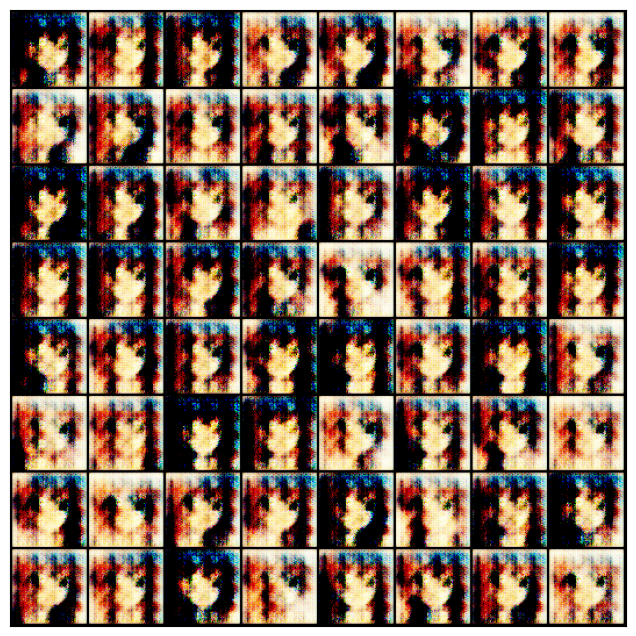

100%|██████████| 288/288 [00:32<00:00,  8.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [3/15], loss_g: 0.5357, loss_d: 0.1119, real_score: 0.8187, fake_score: 0.3917
Saving generated-images-0003.png


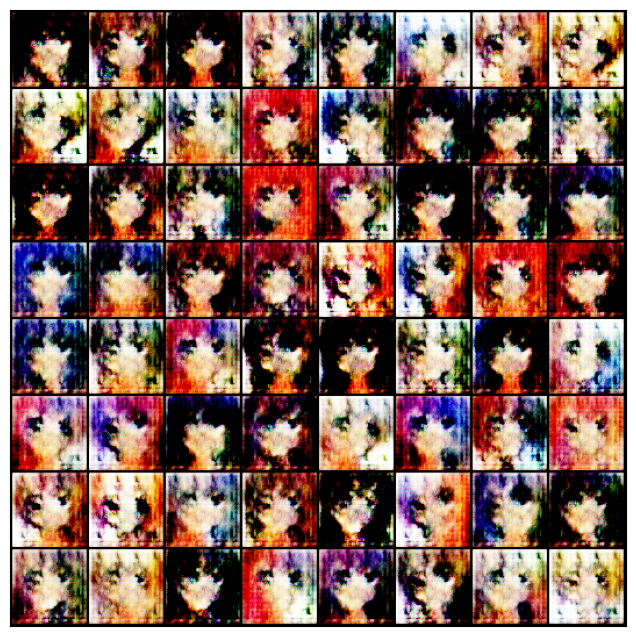

100%|██████████| 288/288 [00:32<00:00,  8.75it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [4/15], loss_g: 0.6207, loss_d: 0.0960, real_score: 0.8378, fake_score: 0.3902
Saving generated-images-0004.png


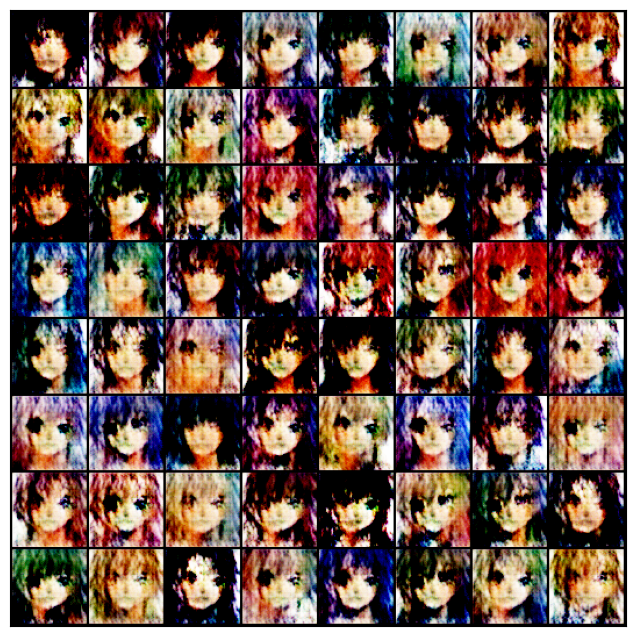

100%|██████████| 288/288 [00:32<00:00,  8.73it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [5/15], loss_g: 0.1787, loss_d: 0.2088, real_score: 0.5284, fake_score: 0.1858
Saving generated-images-0005.png


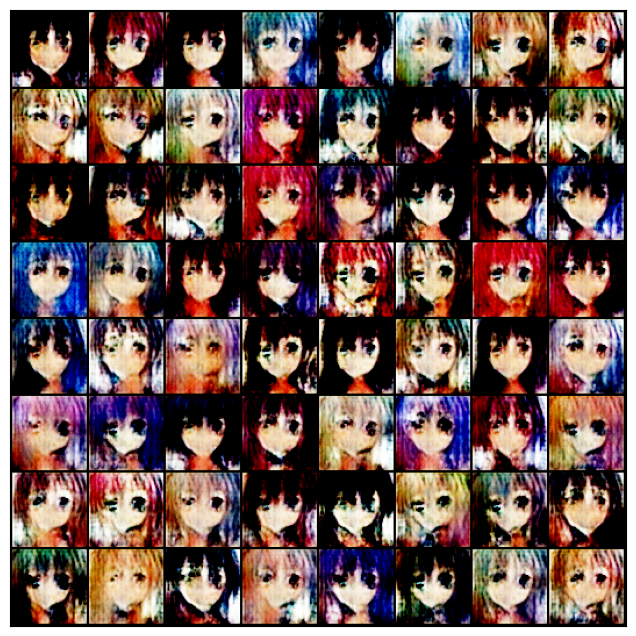

100%|██████████| 288/288 [00:32<00:00,  8.74it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [6/15], loss_g: 0.6523, loss_d: 0.1407, real_score: 0.7226, fake_score: 0.4360
Saving generated-images-0006.png


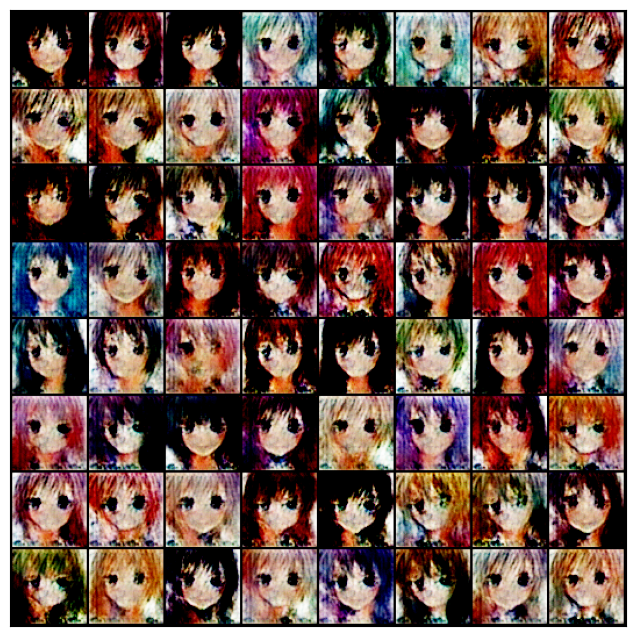

100%|██████████| 288/288 [00:32<00:00,  8.74it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [7/15], loss_g: 0.4833, loss_d: 0.3404, real_score: 0.4514, fake_score: 0.0554
Saving generated-images-0007.png


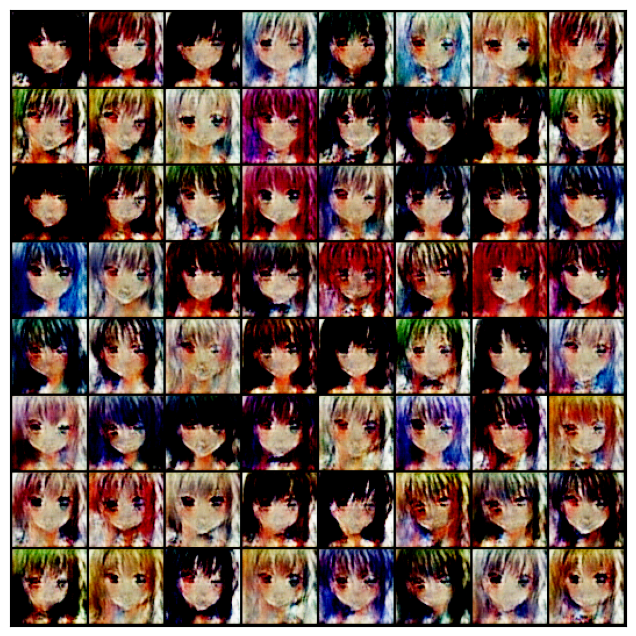

100%|██████████| 288/288 [00:32<00:00,  8.74it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [8/15], loss_g: 0.6965, loss_d: 0.1046, real_score: 0.8295, fake_score: 0.0120
Saving generated-images-0008.png


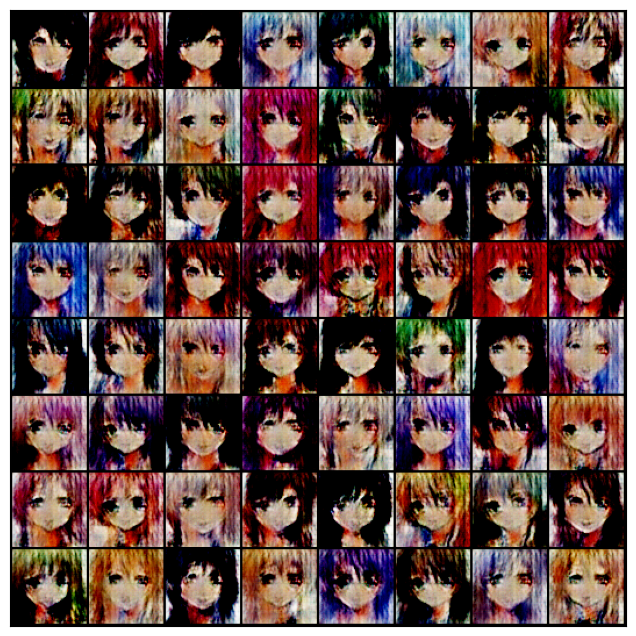

100%|██████████| 288/288 [00:33<00:00,  8.69it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [9/15], loss_g: 0.5648, loss_d: 0.1727, real_score: 0.4312, fake_score: 0.0348
Saving generated-images-0009.png


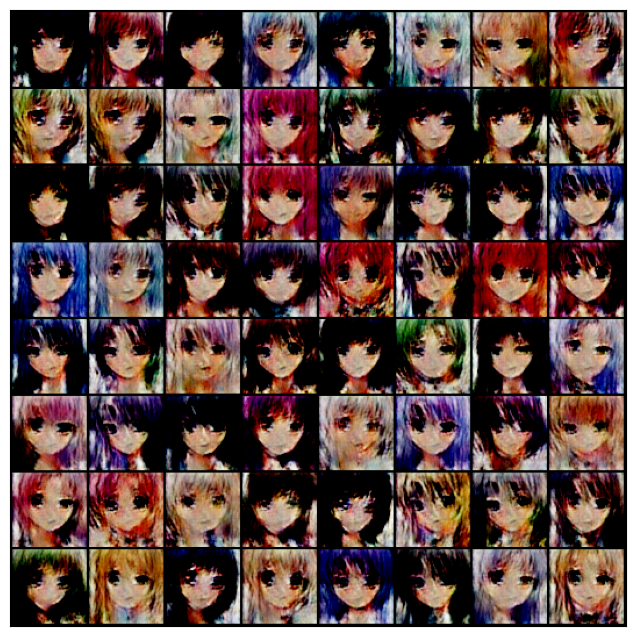

100%|██████████| 288/288 [00:33<00:00,  8.72it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [10/15], loss_g: 0.5777, loss_d: 0.1219, real_score: 0.7013, fake_score: 0.2835
Saving generated-images-0010.png


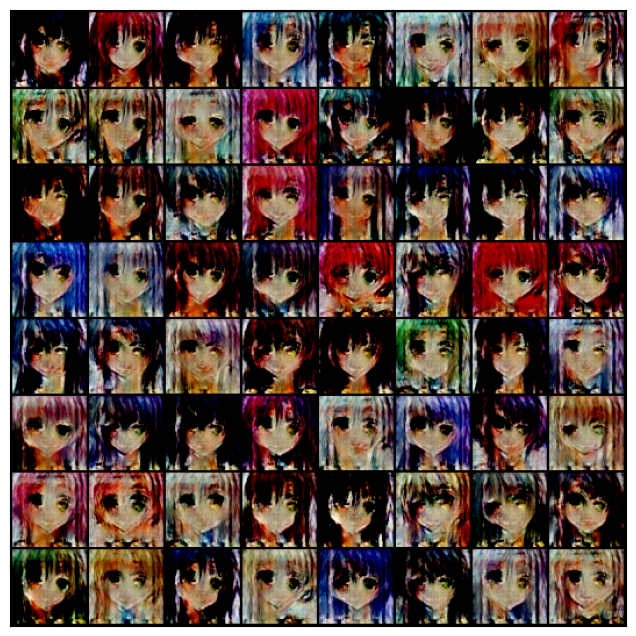

100%|██████████| 288/288 [00:33<00:00,  8.64it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [11/15], loss_g: 0.6196, loss_d: 0.2090, real_score: 0.9694, fake_score: 0.3457
Saving generated-images-0011.png


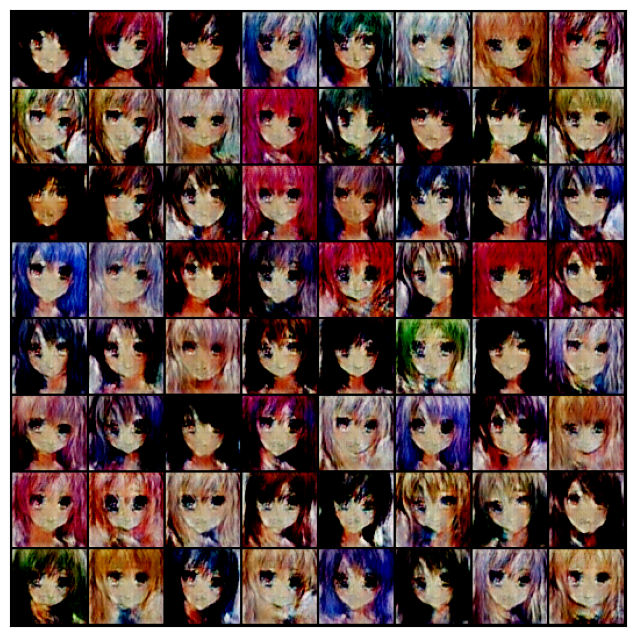

100%|██████████| 288/288 [00:32<00:00,  8.73it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [12/15], loss_g: 0.5875, loss_d: 0.0583, real_score: 0.8954, fake_score: 0.3020
Saving generated-images-0012.png


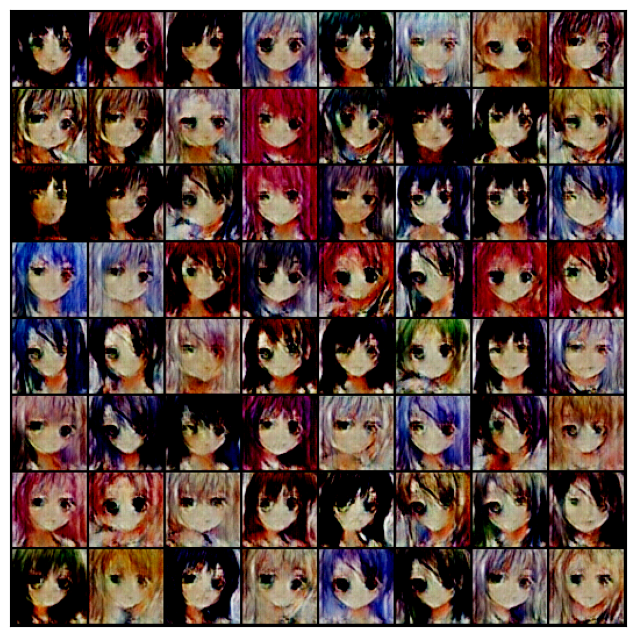

100%|██████████| 288/288 [00:33<00:00,  8.70it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [13/15], loss_g: 0.5102, loss_d: 0.0328, real_score: 0.8674, fake_score: 0.2206
Saving generated-images-0013.png


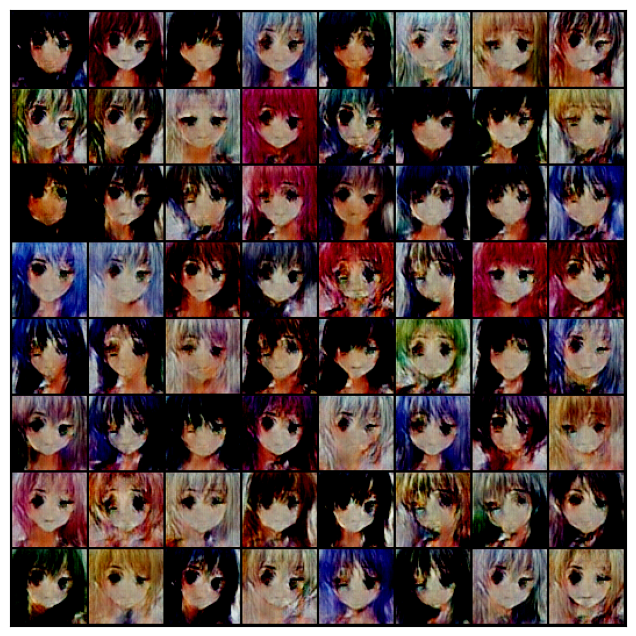

100%|██████████| 288/288 [00:33<00:00,  8.72it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [14/15], loss_g: 0.1248, loss_d: 0.3005, real_score: 0.4200, fake_score: 0.2539
Saving generated-images-0014.png


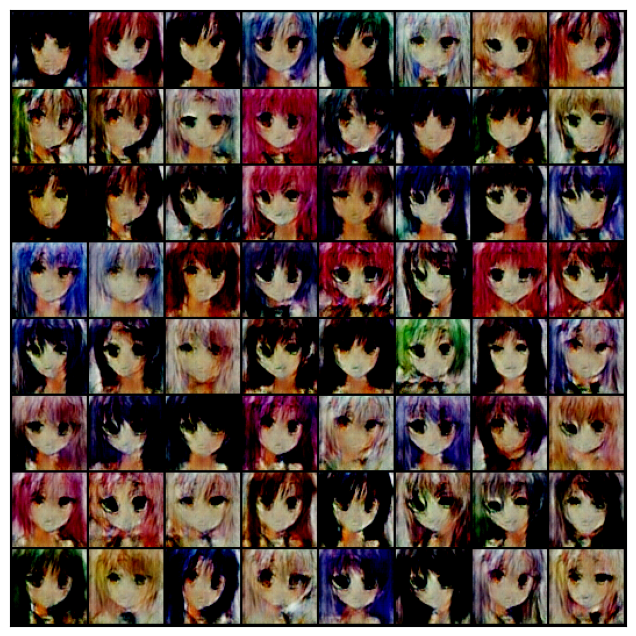

100%|██████████| 288/288 [00:32<00:00,  8.73it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [15/15], loss_g: 0.3476, loss_d: 0.0536, real_score: 0.7248, fake_score: 0.2165
Saving generated-images-0015.png


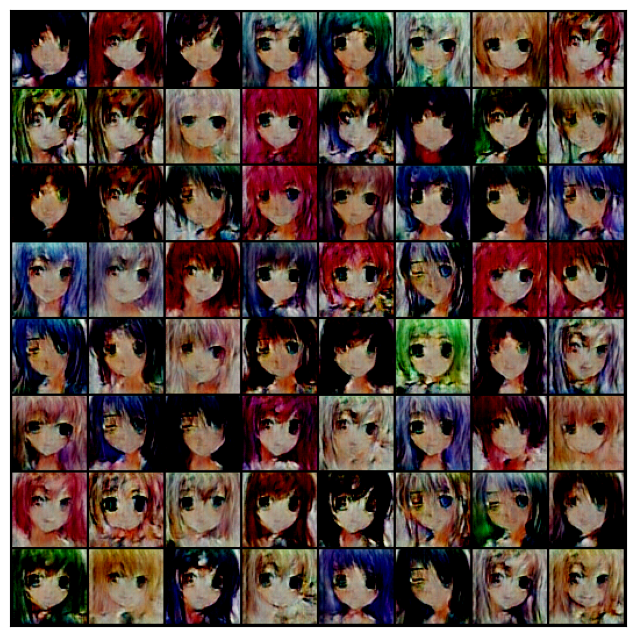

In [16]:
##Define your save path.
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)
def save_samples(index, latent_tensors, generator, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))
        plt.show()
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

losses_g = []
losses_d = []
real_scores = []
fake_scores = []
def train(D, G, d_optimizer, g_optimizer, epochs=1):
    iter_count = 0
    start_idx=1
    for epoch in range(epochs):
        for real_images in tqdm(trainloader):
            real_images=real_images.to(device)
            
            # Pass real images through discriminator
            D_out_real = D(real_images)  
            label_real = torch.full(D_out_real.shape, 1.0).to(torch.device(device))
            real_loss = Real_loss(label_real,D_out_real)
            real_score = torch.mean(D_out_real).item()
            
            # Generate fake images
            noise = torch.randn(batch_size, latent_size, 1, 1).to(torch.device(device))
            fake_images =  G(noise)
            
            # Pass fake images through discriminator
            D_out_fake = D(fake_images)
            label_fake =  torch.full(D_out_fake.shape, 0).to(torch.device(device))
            fake_loss = Fake_loss(label_fake, D_out_fake) 
            fake_score = torch.mean(D_out_fake).item()
            
            # Update discriminator weights
            loss_d = real_loss + fake_loss
            
            d_optimizer.zero_grad()
            loss_d.backward(retain_graph = True)
            d_optimizer.step()
            
            # Generate fake images
            noise2 = torch.randn(batch_size, latent_size, 1, 1).to(torch.device(device))
            fake_images2 =  G(noise2)
            
            gen_steps = 1
            for i in range(0, gen_steps ):
            # Try to fool the discriminator
                D_out_fake2 = D(fake_images2)
           
                # The label is set to 1(real-like) to fool the discriminator
                label_real1 = torch.full(D_out_fake2.shape, 1.0).to(torch.device(device))
                loss_g = Real_loss(label_real1, D_out_fake2)
            
                # Update generator weights
                g_optimizer.zero_grad()
                loss_g.backward(retain_graph = (i<gen_steps -1 ))
                g_optimizer.step()
            
            
        losses_g.append(loss_g.item())
        losses_d.append(loss_d.item())
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
        epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, G, show=True)
            
        state_dis = {'dis_model': D.state_dict(), 'epoch': epoch}
        state_gen = {'gen_model': G.state_dict(), 'epoch': epoch}
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint') 
        torch.save(state_dis, 'checkpoint/'+'D__'+str(epoch+1)) #each epoch
        torch.save(state_gen, 'checkpoint/'+'G__'+str(epoch+1)) #each epoch
#Train the GAN
train(D,G,opt_d,opt_g,epochs=15)

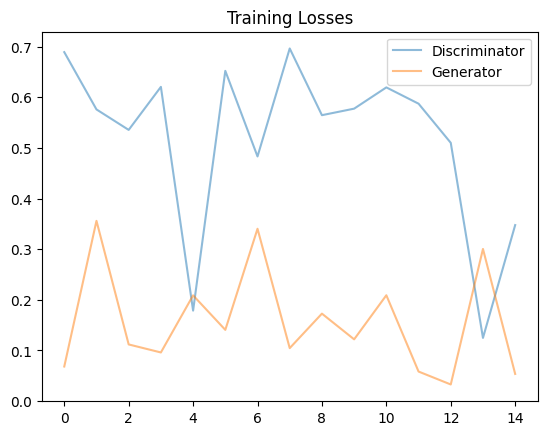

In [17]:
## Visualize your loss curve of D and G
fig, ax = plt.subplots()
plt.plot(losses_g, label='Discriminator', alpha=0.5)
plt.plot(losses_d, label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()